In [1]:
import numpy as np
import pyvista as pv
from pathlib import Path
import matplotlib.pyplot as plt
from PIL import Image
from spherical_harmonic_plotting import (get_sph_harm_mesh, plot_sph_harm_mesh,
                                         plot_sph_harm_mesh_2d)
from tqdm import tqdm

In [2]:
def plot_3d_sph_harm_table(lmax, n_steps=101, real_version=False, radius_from_mag=True,
                           frame_duration_ms=100, gif_duration_ms=2000,
                           animation_name='sph_harm_table_3d', figure_dir=None, **kwargs):
    if figure_dir is None:
        figure_dir = Path.cwd()
    frames_dir = Path(figure_dir, f'frames_{animation_name}')
    frames_dir.mkdir(exist_ok=True, parents=True)
    output_gif = f'{animation_name}.gif'
    gif_path = Path(figure_dir, output_gif)
    
    plotter = pv.Plotter(shape=(lmax + 1, 2 * lmax + 1), 
                     border=False, notebook=False,
                     window_size=[2048, 1536],
                     off_screen=True)
    
    for l in tqdm(range(0, lmax + 1), desc='generating meshes'):
        for m in range(-l, l+1):
            plotter.subplot(l, m + lmax)        
            sph_harm_mesh = get_sph_harm_mesh(l, m, n_steps=101, 
                                              real_version=real_version, 
                                              radius_from_mag=radius_from_mag, **kwargs)
            plot_sph_harm_mesh(sph_harm_mesh, show=False, plotter=plotter)
            plotter.add_text(f'(l, m) = ({l}, {m})', font_size=10)

    num_frames = int(gif_duration_ms / frame_duration_ms)            
    cam_r = 6
    cam_theta = np.pi / 3
    cam_phi_list = np.linspace(0, 2 * np.pi, num_frames, endpoint=False)    
    
    for cam_phi in tqdm(cam_phi_list, desc='Making Phi Frames'):
        file_name = f'cam_phi_{cam_phi:.4f}.png'
        file_path = Path(frames_dir, file_name)
        cam_x = cam_r * np.sin(cam_theta) * np.cos(cam_phi)
        cam_y = cam_r * np.sin(cam_theta) * np.sin(cam_phi)
        cam_z = cam_r * np.cos(cam_theta)
        new_cam_position = (cam_x, cam_y, cam_z)
        for l in range(0, lmax + 1):
            for m in range(-lmax, lmax+1):
                plotter.subplot(l, m + lmax)        
                plotter.camera.position = new_cam_position
        plotter.render()
        plotter.screenshot(filename=file_path)
    plotter.close()

    print(f'Saving gif at {gif_path}')
    frames_paths = frames_dir.glob('*.png')
    img, *imgs = [Image.open(f) for f in frames_paths]
    img.save(fp=gif_path, format='GIF', append_images=imgs,
             save_all=True, duration=frame_duration_ms, loop=0)

In [3]:
def plot_2d_sph_harm_table(lmax, n_steps=101, real_version=False, file_name='sph_harm_table_2d',
                           figure_dir=None, show=True, **kwargs):
    if figure_dir is None:
        figure_dir = Path.cwd()
    figure_dir.mkdir(exist_ok=True, parents=True)
    file_name = Path(file_name).with_suffix('.png')
    file_path = Path(figure_dir, file_name)
    
    num_cols = 2 * lmax + 1
    num_rows = lmax + 1
    fig = plt.figure(figsize=(num_cols*5, num_rows*5))    
    
    for l in tqdm(range(0, lmax + 1)):
        for m in range(-l, l+1):
            row = l
            col = m + lmax
            idx = row * num_cols + col + 1
            ax = fig.add_subplot(num_rows, num_cols, idx)
            sph_harm_mesh = get_sph_harm_mesh(l, m, n_steps=101, 
                                  real_version=real_version, 
                                  radius_from_mag=False, **kwargs)

            plot_sph_harm_mesh_2d(sph_harm_mesh, ax=ax, show=False)
            ax.set_title(f'(l, m) = ({l}, {m})', fontsize=32)
    
    print('setting layout...')
    fig.set_tight_layout(True)
    print('showing...')
    if show:
        plt.show()
    print('saving...')
    fig.savefig(file_path)
    print('saved.')    
    

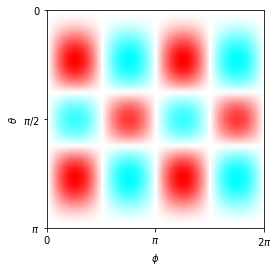

In [5]:
(l, m) = (4, -2)
real_version = True
radius_from_mag = False
sph_harm_mesh = get_sph_harm_mesh(l, m, n_steps=101, 
                                  real_version=real_version, 
                                  radius_from_mag=False)

plot_sph_harm_mesh_2d(sph_harm_mesh)

sph_harm_mesh = get_sph_harm_mesh(l, m, n_steps=101, 
                                  real_version=real_version, 
                                  radius_from_mag=radius_from_mag)
p = plot_sph_harm_mesh(sph_harm_mesh, show=True)

In [6]:
figure_dir = Path(Path.cwd(), 'figures', 'Spherical Harmonics')


plot_3d_sph_harm_table(lmax=10, n_steps=101, real_version=False, radius_from_mag=False,
                       frame_duration_ms=100, gif_duration_ms=2000,
                       animation_name='sph_harm_table_complex_sphere',
                       figure_dir=figure_dir)

plot_3d_sph_harm_table(lmax=10, n_steps=101, real_version=False, radius_from_mag=True,
                       frame_duration_ms=100, gif_duration_ms=2000,
                       animation_name='sph_harm_table_complex_radial_mag',
                       figure_dir=figure_dir)

plot_3d_sph_harm_table(lmax=10, n_steps=101, real_version=True, radius_from_mag=False,
                       frame_duration_ms=100, gif_duration_ms=2000,
                       animation_name='sph_harm_table_real_sphere',
                       figure_dir=figure_dir)

plot_3d_sph_harm_table(lmax=10, n_steps=101, real_version=True, radius_from_mag=True,
                       frame_duration_ms=100, gif_duration_ms=2000,
                       animation_name='sph_harm_table_real_radial_mag',
                       figure_dir=figure_dir)

Making Phi Frames: 100%|███████████████████████████████████████████████████████████████| 20/20 [00:12<00:00,  1.57it/s]


Saving gif at C:\Users\Justin\Desktop\Working\Code\hydrogen plotting\figures\Spherical Harmonics\sph_harm_table_complex_sphere.gif


Making Phi Frames: 100%|███████████████████████████████████████████████████████████████| 20/20 [00:13<00:00,  1.43it/s]


Saving gif at C:\Users\Justin\Desktop\Working\Code\hydrogen plotting\figures\Spherical Harmonics\sph_harm_table_complex_radial_mag.gif


Making Phi Frames: 100%|███████████████████████████████████████████████████████████████| 20/20 [00:13<00:00,  1.47it/s]


Saving gif at C:\Users\Justin\Desktop\Working\Code\hydrogen plotting\figures\Spherical Harmonics\sph_harm_table_real_sphere.gif


Making Phi Frames: 100%|███████████████████████████████████████████████████████████████| 20/20 [00:09<00:00,  2.09it/s]


Saving gif at C:\Users\Justin\Desktop\Working\Code\hydrogen plotting\figures\Spherical Harmonics\sph_harm_table_real_radial_mag.gif


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:10<00:00,  1.07it/s]


setting layout...
showing...
saving...
saved.


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:10<00:00,  1.05it/s]


setting layout...
showing...
saving...
saved.


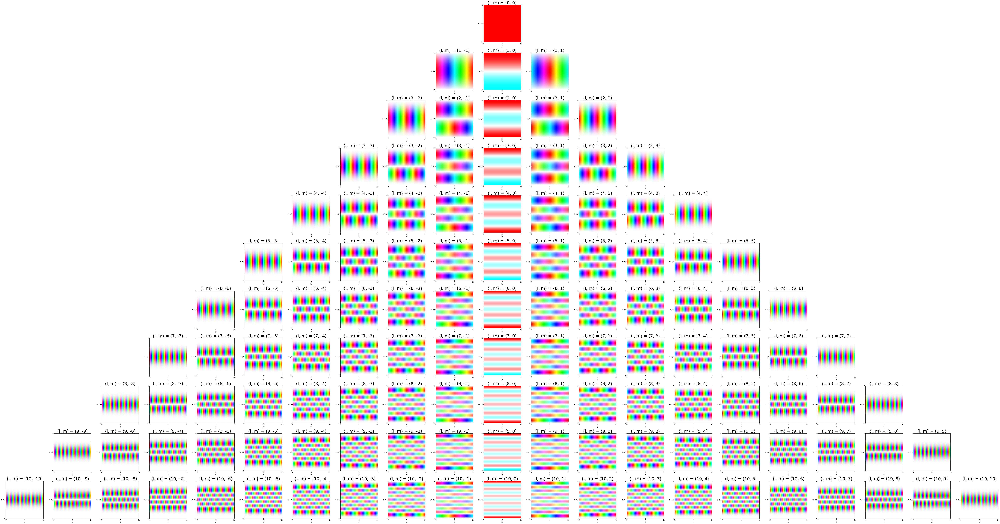

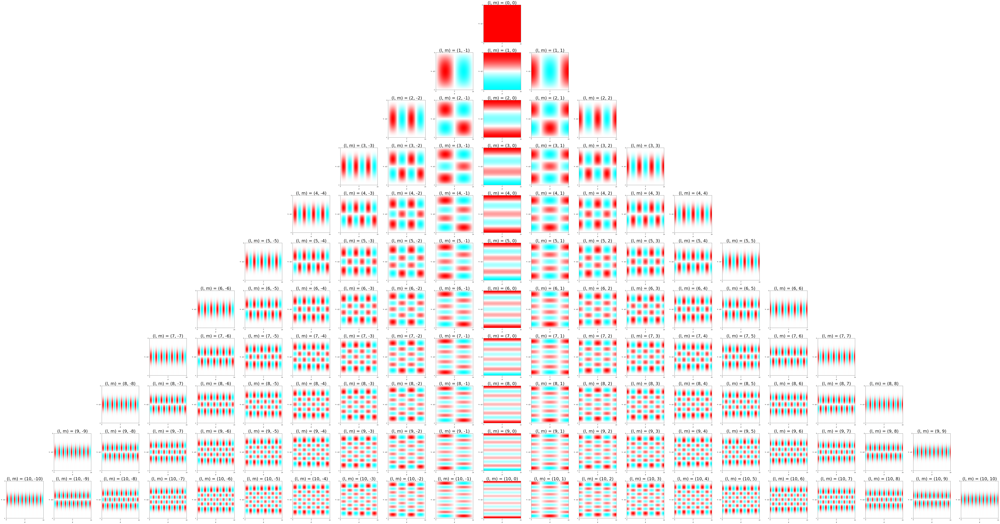

In [6]:
figure_dir = Path(Path.cwd(), 'figures', 'Spherical Harmonics')

plot_2d_sph_harm_table(lmax=10, n_steps=101, real_version=False,
                       file_name='sph_harm_table_complex_2d',
                       figure_dir=figure_dir, show=False)

plot_2d_sph_harm_table(lmax=10, n_steps=101, real_version=True,
                       file_name='sph_harm_table_real_2d',
                       figure_dir=figure_dir, show=False)